# Исследование данных о рынке заведений общественного питания Москвы

Заказчик исследования — фонд «Shut Up and Take My Money». 
 
В работе были использованы данные из датасета с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.  


**Цели исследования**

- изучить рынок заведений общественного питания Москвы. 
  - выявить интересные особенности и получить результаты, которые помогут в выборе места для будущего заведения.
  - изучить данные на предмет открытия новой кофейни, дать рекомендации


**Описание данных**

Датасет **moscow_places** содержит следующую информацию:

- name — название заведения;
- address — адрес заведения;
- category — категория заведения;
- hours — информация о днях и часах работы;
- lat — широта географической точки;
- lng — долгота географической точки;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах;
- price — категория цен в заведении;
- avg_bill — средняя стоимость заказа в виде диапазона;
- middle_avg_bill — средний чек;
- middle_coffee_cup — стоимость одной чашки капучино;
- chain — является ли заведение сетевым (0 - не сетевое, 1 - сетевое);
- district — административный район, в котором находится заведение;
- seats — количество посадочных мест.


**Краткий план работы**

1. Выполнить предобработку данных
- Проверить типы данных в датафрейме и преобразовать там, где это необходимо.
- Изучить пропуски в датафрейме. 
- Проверить, есть ли в данных дубликаты. 
- Изучить столбцы, которые содержат категориальные значения.
- Изучить столбцы, которые хранят количественные значения. 

2. Добавить новые столбцы:
- Создать столбец street с названиями улиц из столбца с адресом.
- Создать столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7). 
   - значение True — если заведение работает ежедневно и круглосуточно;
   - значение False — в противоположном случае.

3. Исследовательский анализ данных:
- Изучить категории заведений. 
   - Исследовать количетсво и распределение заведений по категориям.
   - Исследовать количество посадочных мест в местах по категориям.
   
- Изучить соотношение сетевых и несетевых заведений. 
   - Определить какие категории заведений чаще являются сетевыми.
   - Найти и описать топ-15 популярных сетей в Москве.

- Отобразить общее количество заведений и количество заведений каждой категории по административным районам Москвы.

- Изучить распределение средних рейтингов по категориям заведений.
  - Построить фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.
  
- Отобразить все заведения датасета на карте. 

- Изучить распредление заведений по улицам.
  - Найти топ-15 улиц по количеству заведений по категориям.
  - Найти улицы, на которых находится только один объект общепита.
  
- Изучить значения средних чеков.
  - Посчитать медиану значения для каждого района.
  - Проанализировать цены в центральном административном округе и других. 
  - Изучит влияние удалённости от центра на цены в заведениях.
  
- Изучить и проиллюстрировать другие взаимосвязи в данных

- Заключить наблюдения в один общий вывод.

4. Дополнительное исследование: открытие кофейни. Отсетить на вопросы:  


   - Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
   - Есть ли круглосуточные кофейни?
   - Какие у кофеен рейтинги? Как они распределяются по районам?
   - На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?


5. Описать полученные результаты и зафиксировать итоговый вывод в презентации.

## Шаг 1 Чтение датасета и преобработка данных

### Открываем датасет 

In [1]:
#импорт библиотек 
import pandas as pd
import numpy as np
from numpy import median
import matplotlib.pyplot as plt
import plotly.express as px 
from plotly import graph_objects as go 
import seaborn as sns
from IPython.display import display
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
pd.options.mode.chained_assignment = None
pd.options.display.float_format = '{:,.2f}'.format

In [2]:
#загрузка датасета
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
#загрузка файла с границами районов Москвы
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)
   
moscow_lat, moscow_lng = 55.751244, 37.618423

In [4]:
#посмотрим первые строки датасета
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


In [5]:
#посмотрим общую информацию
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
#проверим количество дубликатов
display('Количество строк дубликатов: {}'. format(data.duplicated().sum()))

#количество пропусков
data.isna().sum().sort_values()

'Количество строк дубликатов: 0'

name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
hours                 536
seats                3611
avg_bill             4590
price                5091
middle_avg_bill      5257
middle_coffee_cup    7871
dtype: int64

In [7]:
#посмотрим информацию о числовых столбцах
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,"8,406.00","8,406.00","8,406.00","3,149.00",535.00,"8,406.00","4,795.00"
mean,55.75,37.61,4.23,958.05,174.72,0.38,108.42
std,0.07,0.10,0.47,"1,009.73",88.95,0.49,122.83
min,55.57,37.36,1.00,0.00,60.00,0.00,0.00
25%,55.71,37.54,4.10,375.00,124.50,0.00,40.00
50%,55.75,37.61,4.30,750.00,169.00,0.00,75.00
75%,55.80,37.66,4.40,"1,250.00",225.00,1.00,140.00
max,55.93,37.87,5.00,"35,000.00","1,568.00",1.00,"1,288.00"


#### Промежуточный вывод

**Описание данных**

Данные содержатся в 8406 строках и 14 столбцах. Данного объема иформации достаточно для исследования.  
Большинство столбцов имеет тип данных object, столбцы с количественными данными хранят тип float и int.   
Явные дубликаты в датасете отсутствуют.

***Типы данных***

Для дальнейшего анализа необходимо исправить следующие некорректные значения:
- **chain** данные представлены в формате int, необходимо привести их в bool

***Пропуски***

- **hours** найти подходящие значения для заполнения мы не сможем, поэтому заменим пропуски на "нет данных".
- **price** изучим пропуски подробнее и решим, что с ними делать.
- **avg_bill** заполнить пропуски подходящим значением мы не сможем, оставим как есть
- **middle_avg_bill**, **middle_coffee_cup** заполнить пропуски подходящим значением мы не сможем, оставим как есть
- **seats** заполним медианным для категории заведений значением 

***Числовые значения***

Значения в столбцах с координатами и рейтингами распределены без аномальных значений и пропусков, поэтому их можно не корректировать.
В некоторых числовых слолбцах встречаются аномально большие значения, напрмиер оценка среднего чека middle_avg_bill - 35,000.00 и количество посадочных мест seats - 1,288.00. Изучим данные подробнее и постараемся избавиться от выбросов.

In [8]:
#создадим датафрейм для внесения изменений
df = data

### Изучим столбец name

In [9]:
#посмотрим на количесвто уникальных значений
df['name'].nunique()

5614

In [10]:
#выведем уникальные названия несетевых заведений, которые дублируются
df[(df['chain'] == 0) & df.duplicated(subset='name', keep=False)]['name'].unique()

array(['Кафе', 'Шаурма', 'Ресторан', 'Кафе-столовая', 'Столовая',
       'Шашлычная', 'Поминальные обеды', 'Бистро', 'Буфет', 'Кофейня',
       'Пиццерия', 'Кафе для поминок', 'Трапезная', 'Блины', 'Чебуречная',
       'Кафе-кулинария'], dtype=object)

Уникальные, конечно, громко сказано, но картина вполне ожидаемая. Подобные повоторы оставляем.

### Изучим столбец category

In [11]:
#отсортируем уникальные значения
sorted(df['category'].unique())

['бар,паб',
 'булочная',
 'быстрое питание',
 'кафе',
 'кофейня',
 'пиццерия',
 'ресторан',
 'столовая']

Данные заполнены кооректно, изменений не требуют.

### Изучим столбец address

In [12]:
#посмотрим на короткие адреса
short_addresses = df[df['address'].str.len() < 21]
short_addresses

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
484,Фастфуд,кофейня,"Москва, парк Дружбы",Северный административный округ,"ежедневно, 10:00–21:00",55.85,37.48,4.20,NaN,NaN,NaN,NaN,0,NaN
3833,Лаки Сувлаки,быстрое питание,"Москва, сад Эрмитаж",Центральный административный округ,"ежедневно, 11:00–23:00",55.77,37.61,4.30,средние,Средний счёт:700–1000 ₽,850.00,NaN,1,NaN
5404,Веранда,ресторан,"Москва, парк Радуга",Восточный административный округ,"ежедневно, 11:00–22:00",55.73,37.82,3.90,NaN,NaN,NaN,NaN,1,NaN
5582,Стардог,кафе,"Москва, парк Радуга",Восточный административный округ,"ежедневно, 10:00–20:00",55.73,37.82,4.80,NaN,NaN,NaN,NaN,0,NaN
6309,Енот,кафе,"Москва, № 7",Южный административный округ,NaN,55.68,37.62,4.80,NaN,NaN,NaN,NaN,0,NaN
7013,Пекарня,булочная,"Москва, парк Зюзино",Юго-Западный административный округ,вт-вс 12:00–20:00,55.65,37.59,3.80,NaN,NaN,NaN,NaN,1,NaN


Ошибочно коротких значений в столбце с адресами не выявлено, текущие данные оставляем как есть.

### Изучим столбец district

In [13]:
#отсортируем уникальные значения
sorted(df['district'].unique())

['Восточный административный округ',
 'Западный административный округ',
 'Северный административный округ',
 'Северо-Восточный административный округ',
 'Северо-Западный административный округ',
 'Центральный административный округ',
 'Юго-Восточный административный округ',
 'Юго-Западный административный округ',
 'Южный административный округ']

Для удобства создадим столбец с сокращенным названием округов.

In [14]:
df['dist'] = df['district'].replace(['Восточный административный округ',
       'Западный административный округ',
       'Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Центральный административный округ',
       'Юго-Восточный административный округ',
       'Юго-Западный административный округ',
       'Южный административный округ'], ['ВАО','ЗАО', 'САО', 'СВАО', 'СЗАО', 'ЦАО', 'ЮВАО', 'ЮЗАО', 'ЮАО'])

In [15]:
sorted(df['dist'].unique())

['ВАО', 'ЗАО', 'САО', 'СВАО', 'СЗАО', 'ЦАО', 'ЮАО', 'ЮВАО', 'ЮЗАО']

### Изучим столбец hours

In [16]:
#выведем количество уникальных значений
df['hours'].nunique()

1307

In [17]:
#заменим пропуски на "нет данных"
df['hours'] = df['hours'].fillna('нет данных')

Вариантов записи значений слишком много, чтобы привести их одному формату. Заменили пропсуки на значение "нет данных"

### Изучим столбец price

In [18]:
#посмотрим уникальные значения
df['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

Столбец содержит 5091 строку с пропусками.   
Проверим наличие строк с пропусками в данном столбце, но где проставлены значения в столбцах  middle_avg_bill и middle_coffee_cup

In [19]:
#проверим пропущенные значения в тех строках, где в столбцах middle_avg_bill и middle_coffee_cup есть данные
df_noprice = df[df['price'].isna() & (df['middle_avg_bill'].notna() | df['middle_coffee_cup'].notna())]
df_noprice

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,dist
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,САО
27,Шаурму Х@чу,быстрое питание,"Москва, улица Дыбенко, 7, стр. 1",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.88,37.48,4.10,NaN,Средний счёт:от 240 ₽,240.00,NaN,0,4.00,САО
32,Додо Пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.88,37.52,4.30,NaN,Средний счёт:328 ₽,328.00,NaN,1,46.00,САО
34,Домино'с Пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.89,37.52,4.20,NaN,Средний счёт:от 500 ₽,500.00,NaN,1,247.00,САО
49,2U-Ту-Ю,пиццерия,"Москва, Ижорская улица, 8А",Северный административный округ,"ежедневно, круглосуточно",55.89,37.51,2.70,NaN,Средний счёт:900 ₽,900.00,NaN,0,NaN,САО
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8366,Ситипицца,пиццерия,"Москва, Ферганская улица, 12",Юго-Восточный административный округ,"ежедневно, 10:00–23:00",55.71,37.81,4.20,NaN,Средний счёт:300–700 ₽,500.00,NaN,0,4.00,ЮВАО
8383,Pizza24/7,пиццерия,"Москва, улица Юных Ленинцев, 10/15к1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.70,37.74,4.20,NaN,Средний счёт:150 ₽,150.00,NaN,0,NaN,ЮВАО
8385,Cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.72,37.72,4.70,NaN,Цена чашки капучино:80–120 ₽,NaN,100.00,0,NaN,ЮВАО
8399,"Пекарня, кафе-гриль",булочная,"Москва, Болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.66,37.58,4.20,NaN,Средний счёт:50–250 ₽,150.00,NaN,0,50.00,ЮЗАО


727 пропусков, которые мы могли бы заполнить, сгрупировав по категориям из столбца price и узнав средние значения столбцов middle_avg_bill и middle_coffee_cup. Но полученные данные будут не точные, а важность этого столбца для дальнейшего исследования не такая высокая. Намного важнее столбцы со значениями средних чеков. 
К тому же заполнив их, мы изавимся лишь от 15% пропусков.  
Отметим этот момент как недочет при составлении датасета и пойдем дальше.

### Изучим столбец middle_avg_bill

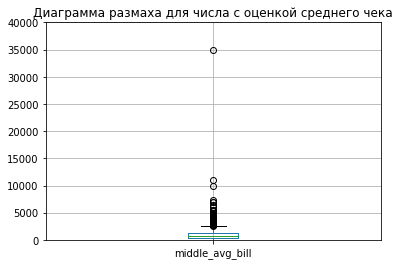

In [20]:
#изучим выбросы и аномальные значения
df.boxplot('middle_avg_bill')
plt.title('Диаграмма размаха для числа с оценкой среднего чека')
plt.ylim(0, 40000)
plt.show()

In [21]:
#посмотрим на строки со значениями выше 9000
df[df['middle_avg_bill'] > 9000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,dist
730,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.87,37.54,4.40,высокие,Средний счёт:5000–17000 ₽,"11,000.00",NaN,0,49.00,САО
5481,Гости,ресторан,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.76,37.76,4.10,высокие,Средний счёт:5000–15000 ₽,"10,000.00",NaN,0,NaN,ВАО
7177,Кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.66,37.65,4.10,высокие,Средний счёт:20000–50000 ₽,"35,000.00",NaN,0,100.00,ЮАО


In [22]:
#посмотрим на строки со значениями ниже 100
df[df['middle_avg_bill'] < 100]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,dist
1951,Пончики! Выпекаем на месте,кофейня,"Москва, улица Яблочкова, 19Г",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.82,37.58,4.60,NaN,Средний счёт:от 50 ₽,50.00,NaN,1,250.00,СВАО
2316,Монастырская чайная,кафе,"Москва, 2-й Красносельский переулок, 5с3",Центральный административный округ,"ежедневно, 09:00–21:00",55.78,37.67,4.10,NaN,Средний счёт:35–100 ₽,67.00,NaN,0,NaN,ЦАО
3688,Кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.75,37.59,4.50,высокие,Средний счёт:от 0 ₽,0.00,NaN,1,200.00,ЦАО
5420,Пончики! Выпекаем на месте,булочная,"Москва, Новокосинская улица, 35",Восточный административный округ,"ежедневно, 08:00–22:00",55.74,37.87,4.30,NaN,Средний счёт:от 50 ₽,50.00,NaN,1,4.00,ВАО
6428,Бургер Mix,быстрое питание,"Москва, улица Гурьянова, 2А",Юго-Восточный административный округ,"ежедневно, 10:00–21:00",55.69,37.72,4.10,низкие,Средний счёт:90 ₽,90.00,NaN,0,40.00,ЮВАО
6543,Пончики! Выпекаем на месте,кофейня,"Москва, проспект Вернадского, 109",Западный административный округ,пн-сб 08:00–22:00; вс 09:00–22:00,55.66,37.48,4.70,NaN,Средний счёт:от 50 ₽,50.00,NaN,1,5.00,ЗАО
7297,Пончики! Выпекаем на месте,кофейня,"Москва, Люблинская улица, 163/1",Юго-Восточный административный округ,"ежедневно, 08:00–22:00",55.65,37.74,4.70,NaN,Средний счёт:50 ₽,50.00,NaN,1,93.00,ЮВАО
7545,Шаурмян у Арена,быстрое питание,"Москва, Краснодарская улица, 47",Юго-Восточный административный округ,"ежедневно, 09:00–23:00",55.68,37.76,3.30,NaN,Средний счёт:от 30 ₽,30.00,NaN,0,2.00,ЮВАО


Удалим строки с аномально большими значениями и нулевым.

In [23]:
#удалим строку со значением 0
df = df[df['middle_avg_bill'] != 0]
df.drop(df[df['middle_avg_bill'] > 9000].index, inplace=True)

### Изучим столбец middle_coffee_cup

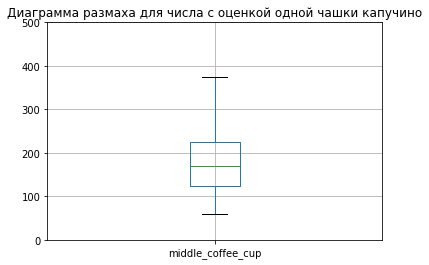

In [24]:
#изучим выбросы и аномальные значения
df.boxplot('middle_coffee_cup')
plt.title('Диаграмма размаха для числа с оценкой одной чашки капучино')
plt.ylim(0, 500)
plt.show()

In [25]:
#посмотрим на строки со значениями выше 500
df[df['middle_coffee_cup'] > 500]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,dist
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.78,37.71,4.20,средние,Цена чашки капучино:230–2907 ₽,NaN,"1,568.00",1,48.00,ВАО


In [26]:
#удалим строку 
df = df[df['middle_coffee_cup'] != 1568]

### Изучим столбец chain 

In [27]:
#меняем тип значений на bool
df['chain'] = df['chain'].astype(bool)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8401 entries, 0 to 8405
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8401 non-null   object 
 1   category           8401 non-null   object 
 2   address            8401 non-null   object 
 3   district           8401 non-null   object 
 4   hours              8401 non-null   object 
 5   lat                8401 non-null   float64
 6   lng                8401 non-null   float64
 7   rating             8401 non-null   float64
 8   price              3310 non-null   object 
 9   avg_bill           3811 non-null   object 
 10  middle_avg_bill    3145 non-null   float64
 11  middle_coffee_cup  534 non-null    float64
 12  chain              8401 non-null   bool   
 13  seats              4791 non-null   float64
 14  dist               8401 non-null   object 
dtypes: bool(1), float64(6), object(8)
memory usage: 992.7+ KB


### Изучим столбец seats

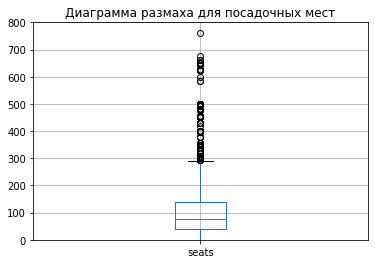

In [28]:
#изучим выбросы и аномальные значения
df.boxplot('seats')
plt.title('Диаграмма размаха для посадочных мест')
plt.ylim(0, 800)
plt.show()

Подозрительно выглядят значения выше 500, изучим их подробнее

In [29]:
#посмотрим на строки со значениями выше 500
display(df[df['seats'] > 500].shape[0])
df[df['seats'] > 500]

56

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,dist
1326,Нам,"бар,паб","Москва, Ленинградский проспект, 69, стр. 1",Северный административный округ,"ежедневно, 11:00–21:00",55.80,37.52,4.20,NaN,NaN,NaN,NaN,True,625.00,САО
1351,Максима Пицца,пиццерия,"Москва, Ленинградский проспект, 78, корп. 1",Северный административный округ,"пн-пт 09:00–00:00; сб,вс 10:00–00:00",55.81,37.51,4.30,выше среднего,Средний счёт:1500–1800 ₽,"1,650.00",NaN,False,625.00,САО
1355,Страдивари,ресторан,"Москва, Ленинградский проспект, 77, корп. 1",Северный административный округ,"ежедневно, 11:00–23:00",55.80,37.51,4.20,выше среднего,Средний счёт:1000–2000 ₽,"1,500.00",NaN,True,625.00,САО
1367,Академия,пиццерия,"Москва, Ленинградский проспект, 72, корп. 1",Северный административный округ,"пн-пт 09:00–23:00; сб,вс 11:00–23:00",55.81,37.52,4.20,средние,Средний счёт:1000–1200 ₽,"1,100.00",NaN,True,625.00,САО
1380,Север-Метрополь,кофейня,"Москва, Ленинградский проспект, 75, корп. 1",Северный административный округ,"ежедневно, 09:00–21:00",55.80,37.51,4.60,NaN,NaN,NaN,NaN,True,625.00,САО
1385,Чайхона на Соколе,кафе,"Москва, Ленинградский проспект, 69, стр. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.80,37.52,4.30,средние,Средний счёт:400–800 ₽,600.00,NaN,False,625.00,САО
1393,Кулинарная лавка братьев Караваевых,кафе,"Москва, Ленинградский проспект, 72, корп. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.81,37.52,4.30,NaN,Средний счёт:500–800 ₽,650.00,NaN,True,625.00,САО
1442,ABC coffee roasters,кофейня,"Москва, Ленинградский проспект, 72, корп. 1",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.81,37.52,4.50,средние,Цена чашки капучино:220–270 ₽,NaN,245.00,False,625.00,САО
1446,9 Bar Coffee,кофейня,"Москва, Ленинградский проспект, 80, корп. 1",Северный административный округ,"пн-пт 07:30–21:00; сб,вс 07:30–19:00",55.81,37.51,4.30,NaN,Цена чашки капучино:60–150 ₽,NaN,105.00,True,625.00,САО
1464,Находка,ресторан,"Москва, Ленинградский проспект, 74, корп. 1",Северный административный округ,"ежедневно, 09:00–22:00",55.80,37.52,4.90,NaN,NaN,NaN,NaN,True,625.00,САО


Есть много повторяющихся значенией с привязкой к одной улице, но разным строениям.  

Например на проспекте Вернадского заведения имеют одинако большое количество посадочных мест 1288, а на Ленинградском проспекте -  625. Похоже на вброс или ошибку при выгрузке данных.  

Избавимся от аномально больших значений.
Терять эти строки не хочется, тогда пропадут заведения в целых районах. Заполним их пропусками, а затем впишем туда значение медианы для каждой категории заведения, чтобы избежать в дальнейшем ложного соотношения.

In [30]:
df.loc[df['seats'] > 500, 'seats'] = np.nan

In [31]:
#заполним пропуски медианным значением по категориям заведений
df['seats'] = df['seats'].fillna(df.groupby('category')['seats'].transform('median'))
df.isna().sum().sort_values()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
chain                   0
seats                   0
dist                    0
avg_bill             4590
price                5091
middle_avg_bill      5256
middle_coffee_cup    7867
dtype: int64

### Вывод

Проведя предобратботку данных мы проделали следующую работу:

1. Изменили тип данных в столбце **chain** на bool   



2. Заполнили пропуски
- **hours** на нет данных
- **seats** медианным значением для каждой категории заведений

3. Избавились от аномальных значений в **middle_avg_bill**, **middle_coffee_cup** и **seats**  


4. Проверили наличие дубликатов и корректность записи категориальных значений. 

В итоге проделанной работы имеем датасет с количеством строк 8401 с более качественными данными для дальнейшего исследования.   
Проверим сколько процентов информации нам удалось сохранить:

In [32]:
#сравним изначальный датасет с итоговым
display('Нам удалось сохранить: {:.1%} данных'. format(len(df) / len(data)))

'Нам удалось сохранить: 99.9% данных'

## Добавляем новые столбцы

### Cтолбец street с названиями улиц

In [33]:
#создаем столбец
df['street'] = df['address'].apply(lambda x: x.split(',')[1].strip())

In [34]:
#проверяем результат
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,dist,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,False,60.00,САО,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,False,4.00,САО,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,False,45.00,САО,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,False,78.00,САО,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,True,148.00,САО,Правобережная улица


### Cтолбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [35]:
#создаем функцию с условием
def is_24_7(hours):
    if hours == 'ежедневно, круглосуточно':
        return True
    else:
        return False

In [36]:
#создаем столбец
df['is_24_7'] = df['hours'].apply(is_24_7)

In [37]:
#проверяем результат
df.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,dist,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,False,60.00,САО,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,False,4.00,САО,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,False,45.00,САО,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,False,78.00,САО,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,True,148.00,САО,Правобережная улица,False
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.89,37.51,4.60,средние,NaN,NaN,NaN,False,52.00,САО,Ижорская улица,False
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.89,37.52,4.40,средние,Средний счёт:199 ₽,199.00,NaN,False,45.00,САО,Клязьминская улица,False
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.89,37.52,4.70,средние,Средний счёт:200–300 ₽,250.00,NaN,False,45.00,САО,Клязьминская улица,False
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.54,4.80,средние,Средний счёт:от 500 ₽,500.00,NaN,False,79.00,САО,Дмитровское шоссе,False
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.88,37.52,4.30,средние,Средний счёт:1000–1200 ₽,"1,100.00",NaN,False,65.00,САО,Ангарская улица,False


### Вывод

На данном этапе нам удалось создать два столбца:

1. **street** с названием улицы
2. **is_24_7** со значем True для круглосуточных заведений и False для остальных


## Исследовательский анализ данных

**Задачи данного этапа:**

- Изучить категории заведений. 
   - Исследовать распределение количества заведений по категориям.
   - Исследовать количество посадочных мест в местах по категориям.
   
- Изучить соотношение сетевых и несетевых заведений. 
   - Определить какие категории заведений чаще являются сетевыми.
   - Найти и описать топ-15 популярных сетей в Москве.

- Отобразить общее количество заведений и количество заведений каждой категории по административным районам Москвы.

- Изучить распределение средних рейтингов по категориям заведений.
  - Построить фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.
  
- Отобразить все заведения датасета на карте. 

- Изучить распредление заведений по улицам.
  - Найти топ-15 улиц по количеству заведений по категориям.
  - Найти улицы, на которых находится только один объект общепита.
  
- Изучить значения средних чеков.
  - Посчитать медиану значения для каждого района.
  - Проанализировать цены в центральном административном округе и других. 
  - Изучит влияние удалённости от центра на цены в заведениях.
  
- Изучить и проиллюстрировать другие взаимосвязи в данных

- Заключить наблюдения в один общий вывод.    

### Рассмотрим распределение количества заведений по категориям

In [38]:
colors = ['#4E6136', '#9EB56E', '#EBE8BE', '#DBBE84', '#B57D48', '#DE892F', '#783828', '#B8543C', '#648C75']
custom_palette = sns.color_palette(colors)

In [39]:
count_per_category = df.groupby('category')['name'].count()

fig = go.Figure(data=[go.Pie(labels=count_per_category.index, values=count_per_category.values)])
fig.update_traces(marker=dict(colors=colors))
fig.update_layout(title_text="Распределение количества заведений по категориям")
fig.show()

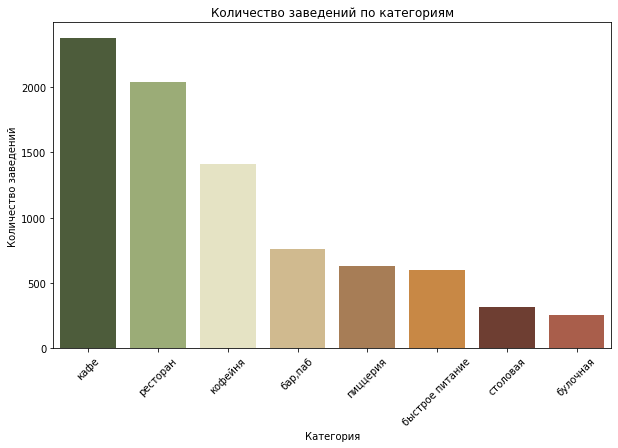

In [40]:
#построим столбчатую диаграмму
category_count = df.groupby('category')['name'].count().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=category_count.index, y=category_count.values, palette=custom_palette)
plt.title('Количество заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)  
plt.show()

Самые многочисленные категории (больше 1000 заведений)
- кафе (2348), 
- рестораны (2014) 
- кофейни (1411).  

Меньше 10% категорий это бар/паб, пиццерии и быстрое питание.  
Самый малочисленные - столовые и булочные - меньше 4%.

### Рассмотрим распределение количества посадочных мест по категориям

Построим столбчатую диаграмму с медианным значением количетсва мест для каждой категории

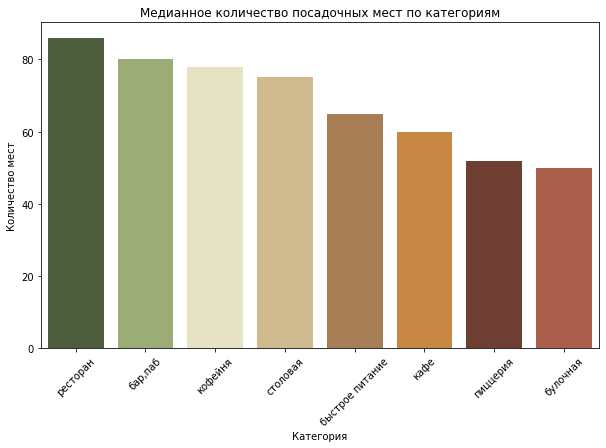

In [41]:
median_seats = df.groupby('category')['seats'].median().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=median_seats.index, y=median_seats.values, palette=custom_palette)
plt.title('Медианное количество посадочных мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество мест')
plt.xticks(rotation=45)  
plt.show()

Вместительнее всех категорий  являются рестораны, а для булочных характерно небольшое количество посадочных мест.
Диаграмма будет полезна при планировании открытия нового заведения.  
Стоит ориентироваться на следующее количество стульев в закупку:
- 80-90 для ресторанов и баров/пабов
- 70-80 для кофейни и столовых
- 60-70 для кафе и заведений быстрого питания
- 50-60 для пиццерий и булочных

### Рассмотрим соотношение сетевых и несетевых заведений

In [42]:
count_per_chain = df.groupby('chain')['name'].count()

labels = ['Несетевые' if chain == False else 'Сетевые' for chain in count_per_chain.index]
fig = go.Figure(data=[go.Pie(labels=labels, values=count_per_chain.values,
                             marker=dict(colors=['#B57D48', '#9EB56E']))])
fig.update_layout(title_text="Соотношение сетевых и несетевых заведений")
fig.show()

Больше 60% всех заведений Москвы - несетевые

### Определим какие категории заведений чаще являются сетевыми

In [43]:
#создаем датафрейм
chain_per_category = df.pivot_table(index='category', values='name', columns = 'chain', aggfunc='count').reset_index()
chain_per_category.columns = ['category', 'non_chain', 'chain']
chain_per_category['non_chain_percent'] = chain_per_category['non_chain'] \
                                        / (chain_per_category['non_chain'] + chain_per_category['chain']) * 100
chain_per_category['chain_percent'] = chain_per_category['chain'] \
                                    / (chain_per_category['non_chain'] + chain_per_category['chain']) * 100
sorted_chain_per_category = chain_per_category.sort_values(by='chain_percent', ascending=False)
sorted_chain_per_category = sorted_chain_per_category \
                            .rename(columns={'chain_percent': 'Процент сетевых', 'non_chain_percent': 'Процент несетевых'})

In [44]:
#строим столбчатую диаграмму
colors = {'Процент несетевых': '#B57D48', 'Процент сетевых': '#9EB56E'}
fig = px.bar(sorted_chain_per_category, 
             x='category', 
             y=['Процент несетевых', 'Процент сетевых'],
             title='Процентное распределение сетевых и несетевых заведений по категориям',
             barmode='group',
             color_discrete_map=colors)

fig.update_layout(xaxis_title='Категории', yaxis_title='Процент')
fig.show()

Булочные, пиццерии и кофейни - чаще сетевые заведения. 
В остальных категориях больший процент составляют несетевые заведения. 

### Найдем топ-15 популярных сетей в Москве

In [45]:
#создадим таблицу 
top_chain = (df.loc[df['chain'] == True].pivot_table(index = ['name', 'category'], values = 'rating', aggfunc = 'count'))
top_chain.columns = ['count']
top_chain = top_chain.reset_index().sort_values(by='count', ascending=False).head(15)
#top_chain

In [46]:
# Список цветов
colors_top_15 = ['#B57D48', '#DE892F', '#783828', '#DBBE84', '#9EB56E']


In [47]:
#построим столбчатую диаграмму
fig = px.bar(top_chain, 
             x='name', 
             y='count',
             color='category',
             text='count',
             title='Топ 15 сетевых заведений',
             color_discrete_sequence=colors_top_15
             )

fig.update_layout(xaxis_title='Наименования сетевых заведений', yaxis_title='Количество заведений')
fig.show()

В топ 15 вошли заведения следующих категорий: кофейня, пиццерия, ресторан, кафе и булочная.
Категория кофейни самая популярная среди сетей.
Лидеры по количеству заведений - Шоколадница, Домино'c пицца и Додо Пицца.

### Отобразим  количество заведений по административным районам Москвы

In [48]:
# Список цветов
colors_cat = ['#DBBE84', '#783828', '#B57D48', '#DE892F', '#4E6136', '#EBE8BE', '#9EB56E', '#B8543C']

In [49]:
#вычисляем количество заведений для каждого административного округа
df_counts = df['dist'].value_counts().reset_index()
df_counts.columns = ['dist', 'count']

#сортируем округа по количеству заведений
sorted_districts = df_counts.sort_values(by='count', ascending=False)['dist']

#строим гистограмму с использованием сортировки административных округов
fig = px.histogram(df, 
                   x='dist', 
                   color='category', 
                   histfunc="count",
                   title='Общее количество заведений по административным районам Москвы',
                   color_discrete_sequence=colors_cat,
                   category_orders={'dist': sorted_districts}
                   )
fig.update_xaxes(title_text='Административный округ') 
fig.update_yaxes(title_text='Количество заведений') 
fig.show()

В центральном округе расположилось больше всего заведений, лидер среди категорий - рестораны.
Так же в ЦАО значительно больше баров/пабов и кофеен, чем в других районах.  

В остальных округах преобладает категория кафе.  

Меньше всего заведений расположено в северо-западном округе.  

Пиццерии, булочные, быстрое питание и столовые распределены по округам равномерно.

### Изучим распределение средних рейтингов по категориям заведений.

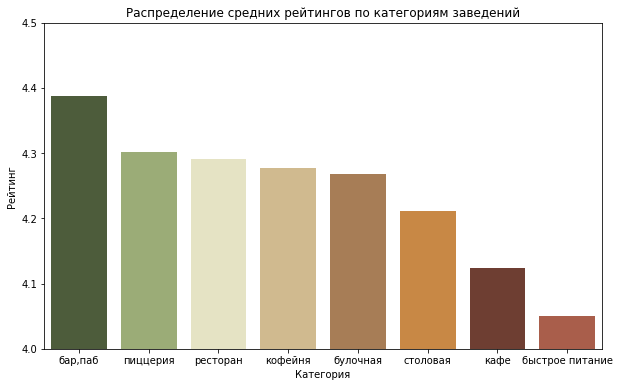

In [50]:
#построим столбчатую диаграмму со средним значением рейтинга
mean_rating_category = df.groupby('category')['rating'].mean().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=mean_rating_category.index, y=mean_rating_category.values, palette=custom_palette)
plt.ylim(4, 4.5)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Рейтинг') 
plt.show()


Все значения находятся в диапазоне между 4 и 4,4.
Максимальное значение рейтинга у заведений категории бар/паб, наименьшее у быстрого питания.

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [51]:
#создадим таблицу
rating_df = df.groupby('district')['rating'].mean().sort_values(ascending=False)
#rating_df


In [52]:
# создаём карту Москвы
m_rate = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

In [53]:
# создаём хороплет 
Choropleth(
    geo_data=geo_json,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m_rate)

m_rate

Лидер по среднему рейтингу заведений - Центральный административный район.
Ниже рейтинг в Северном и Северо-западном районе.
ЮВАО - область с наименьшим средним рейтингом.

### Отобразим все заведения датасета на карте

In [54]:
#добавляем кластеры на ранее созданную карту
marker_cluster = MarkerCluster().add_to(m_rate)

In [55]:
#пишем функцию и добавляем кластер
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
df.apply(create_clusters, axis=1)
m_rate

### Найдем топ-15 улиц по количеству заведений по категориям

In [56]:
#создадим таблицу 
top_street = df.pivot_table(index = 'street', values = 'name', aggfunc = 'count')
top_street.columns = ['count']
top_street = top_street.reset_index().sort_values(by='count', ascending=False).head(15)
#top_street

In [57]:
#переводим таблицу в список и оставляем в датасете улицы из этого списка
top_street_list = top_street['street'].tolist()
top_street_df = df.query('street in @top_street_list')

In [58]:
# Список цветов
colors_cat_street = ['#783828', '#DBBE84', '#DE892F', '#B8543C', '#B57D48', '#EBE8BE', '#4E6136', '#9EB56E']

In [71]:
#вычисляем количество заведений для каждой улицы
df_street_counts = top_street_df['street'].value_counts().reset_index()
df_street_counts.columns = ['street', 'count']

#сортируем улицы по количеству заведений
sorted_street_counts = df_street_counts.sort_values(by='count', ascending=False)['street']

In [60]:
#строим гистограмму
fig = px.histogram(top_street_df, 
                   x='street', 
                   color='category', 
                   histfunc="count",
                   title='Топ 15 улиц по количеству заведений',
                   color_discrete_sequence=colors_cat_street,
                   category_orders={'street': sorted_street_counts}
                   )
fig.update_xaxes(title_text='Наименование улиц') 
fig.update_yaxes(title_text='Количетсво заведений') 
fig.show() 

Стоит отметить, что в топ 15 вошли крупные улицы: шоссе и проспекты, скорее всего из-за транспортной доступности.

### Найдем улицы, на которых находится только один объект общепита

In [61]:
#создадим список с такими улицами и оставим в датафрейме строки только с ними
street_only_one = df['street'].value_counts().reset_index().query('street == 1')
street_only_one = street_only_one['index'].tolist()
street_only_one = df.query('street in @street_only_one')
#street_only_one


In [62]:
#cписок цветов
colors_cat_one = ['#B8543C', '#DBBE84', '#B57D48', '#783828', '#4E6136', '#EBE8BE', '#DE892F', '#9EB56E']

In [69]:
#вычисляем количество заведений для каждого административного округа
street_only_one_counts = street_only_one['dist'].value_counts().reset_index()
street_only_one_counts.columns = ['dist', 'count']

#сортируем округа по количеству заведений
sorted_street_only_one_counts = street_only_one_counts.sort_values(by='count', ascending=False)['dist']

In [70]:
#строим гистограмму
fig = px.histogram(street_only_one, 
                   x='dist', 
                   color='category', 
                   histfunc="count",
                   title='Районы Москвы с количеством улиц с одним заведением',
                   color_discrete_sequence=colors_cat_one,
                   category_orders={'dist': sorted_street_only_one_counts}
                   )
fig.update_xaxes(title_text='Наименования районов') 
fig.update_yaxes(title_text='Количество улиц') 
fig.show() 

ЦАО вновь лидирует - в нем находится больше всего улиц с один заведением, в основном это кафе, рестораны и кофейни.

### Изучим значения средних чеков для каждого района

In [74]:
#создадим таблицу
bill_df = df.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False)
#bill_df


In [75]:
# создаём карту Москвы
m_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

In [76]:
# создаём хороплет 
Choropleth(
    geo_data=geo_json,
    data=bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медиана среднего чека по районам',
).add_to(m_bill)

m_bill

Помимо очевидного лидера - ЦАО, самые высокие средние чеки на западе Москвы.
На юге и юго-востоке столицы цены ниже.

Относительно этих данных мы не можем подтвердить, что на средний чек влияет удаленность от центра.
Скорее на данный показатель оказывают влияние статус, престижность района и инфраструктура.

### Дополнительно: изучим  круглосуточные заведения

In [77]:
count_per_24_7 = df.groupby('is_24_7')['name'].count()

labels = ['Не круглосуточные' if is_24_7 == False else 'Круглосуточные' for is_24_7 in count_per_24_7.index]
fig = go.Figure(data=[go.Pie(labels=labels, values=count_per_24_7.values,
                             marker=dict(colors=['#9EB56E', '#B57D48']))])
fig.update_layout(title_text="Соотношение круглосуточных и не круглосуточных заведений")
fig.show()

Меньше 10% всех заведений круглосуточные

Изучим распредление круглосуточных заведений по районам и категориям.

In [78]:
df_is_24_7 = df.query('is_24_7 == True')

In [79]:
#список цветов
colors_cat_chain = ['#4E6136', '#783828', '#9EB56E', '#DBBE84', '#DE892F', '#EBE8BE', '#B57D48', '#B8543C']

In [80]:
#вычисляем количество круглосуточных заведений для каждого административного округа
dist_counts = df_is_24_7['dist'].value_counts().reset_index()
dist_counts.columns = ['dist', 'count']

#сортируем административные округа по количеству заведений
sorted_dists = dist_counts.sort_values(by='count', ascending=False)['dist']

In [82]:
#строим гистограмму
fig = px.histogram(df_is_24_7, 
                   x='dist', 
                   color='category', 
                   histfunc="count",
                   title='Общее количество круглосуточных заведений по административным районам Москвы',
                   color_discrete_sequence=colors_cat_chain, 
                   category_orders={'dist': sorted_dists}
                   )
fig.update_xaxes(title_text='Административный округ') 
fig.update_yaxes(title_text='Количетсво круглосуточных заведений') 
fig.show() 

Больше всего круглосуточных заведений в центральном округе. За ним идут восточный и юго-восточный административный округ.
Среди категорий круглосуточных заведений чаще встречаются кафе, быстрое питание и рестораны.

### Вывод

Изучив рынок заведений общественного питания города Москвы мы обнаружили следующее:  

**Категории заведений**

    Из восьми категорий заведений в Москве преобладают кафе, рестораны и кофейни.  
    Меньше 10% составляют бары/пабы, пиццерии, быстрое питание, меньше 4% - столовые и булочные.

**Посадочные места**

    Больше всего посадочных мест в ресторанах и барах/пабах, меньше всего в пиццериях и булочных. 
    Медианные значения по категориям:
    - 80-90 для ресторанов и баров/пабов
    - 70-80 для кофейни и столовых
    - 60-70 для кафе и заведений быстрого питания
    - 50-60 для пиццерий и булочных
    
**Сети заведений**  

    Большая часть заведений несетвые, к сетевым относиться чуть меньше 40% всех заведений.
    Соотношение сетевых заведений больше всего у категорий булочные, пиццерии и кофейни
    
    В топ популярных сетей вошли 5 категорий заведений
    - кофейни: Шоколадница, One Price Coffee, Cofix, КОФЕПОРТ, CofeFest и Кофемания
    - пиццерии: Домино'с Пицца и Додо Пицца
    - рестораны: Яндекс Лавка, Prime, Теремок
    - кафе: Кулинарная лавка братьев Караваевых, Чайхана, Drive Café
    - булочная: Буханка
    
**Распределение по административным районам**


    В ЦАО расположено больше всего заведений, чаще всего это рестораны.
    Так же в центральном районе значительно больше баров/пабов и кофеен, чем в других районах.  
    В остальных округах преобладает категория кафе. 
    
    Меньше всего заведений расположено в северо-западном округе.  
    Пицерии, булочные, быстрое питание и столовые рапределны по округам равномерно.

**Рейтинги заведений**


    Значения рейттингов всех категорий находятся в диапазоне между 4 и 4,4.
    Самые высокие рейтинги у баров и пабов, самые худшие у заведений быстрого питания. 

    Выше рейтинг у заведений находящихся в центральном, северном и северо-западном районах
    Ниже всего рейтинг у заведений на юго-востоке Москвы

**Распределение по улицам**  

    В топ 15 улиц с самым большим количетсвом заведенийвошли крупные улицы: шоссе и проспекты, 
    скорее всего из-за траспортной доступности.
    На улицах только с одним заведением чаще всего встречаются категории кафе, рестораны и кофейни.

**Средний чек**  

    Самые высокие средние чеки в ЦАО, а так же на западе Москвы. 
    На юге и юго-востоке столицы средние чеки самые низкие.
    Из этого можем сделать вывод, что на средний чек влияет не удаланность от центра 
    а статус, престижность района и инфраструктура.

**Круглосуточные заведния**   

    Меньше 10% заведений являются круглосуточными.
    Больше всего круглосуточных заведений в центральном округе. За ним идут восточный и юго-восточный административный округ. 
    Среди категорий круглосуточных заведений чаще встречаются кафе, быстрое питание и рестораны.

## Исследование: открытие кофейни

### Рассмотрим распределение количества кофеен по районам

In [83]:
df_cofee_shop = df.query('category == "кофейня"')

In [84]:
#создадим таблицу
cofee_shop_per_dist = df_cofee_shop.groupby('district')['name'].count().sort_values(ascending=False)
cofee_shop_per_dist.columns = ['district', 'count']
#cofee_shop_per_dist


In [85]:
# создаём карту Москвы
m_cofee_shop = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

In [86]:
# создаём хороплет 
Choropleth(
    geo_data=geo_json,
    data=cofee_shop_per_dist,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m_cofee_shop)

#m_cofee_shop

In [87]:
#добавляем кластеры на ранее созданную карту
marker_cluster = MarkerCluster().add_to(m_cofee_shop)

In [88]:
#пишем функцию и добавляем кластер
def create_clusters(row):
    icon_url = 'https://img.icons8.com/?size=100&id=0mCkFDtwZED5&format=png&color=000000'
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)
df_cofee_shop.apply(create_clusters, axis=1)
m_cofee_shop

В датасете представлены 1411 кофейни.
Больше всего кофеен расположено в центральном округе, плотность их расположения довольно высокая.
Меньше всего кофеен в северо-западном, юго-восточном и юго-западном округе. 
Их можно рассмотреть для открытия новой кофейни с точки зрения наименьшей конкуренции.

### Изучим распределение рейтингов кофеен по районам

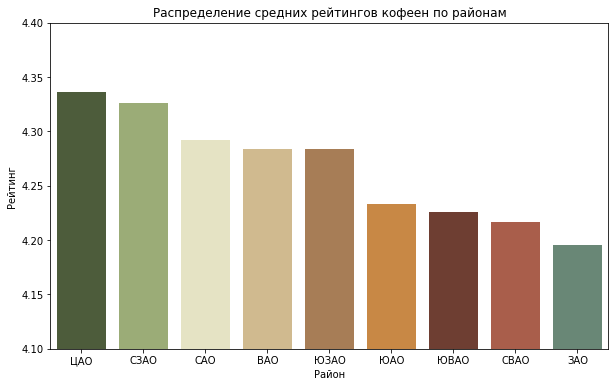

In [89]:
#построим столбчатую диаграмму со средним значением рейтинга
cofee_shop_rating = df_cofee_shop.groupby('dist')['rating'].mean().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=cofee_shop_rating.index, y=cofee_shop_rating.values, palette=custom_palette)
plt.ylim(4.1, 4.4)
plt.title('Распределение средних рейтингов кофеен по районам')
plt.xlabel('Район')
plt.ylabel('Рейтинг') 
plt.show()

Значения по районам не сильно отличаются. 

Наивысший показатель у ЦАО, но также выделяется северо-западный округ.  
Средний рейтинг этого района лишь немногим отличается от центрального, хотя в нем в 7 раз меньше подобных заведений.
Наименьший показатель у западного округа.
Среди районов с наименьшим количеством кофеен (СЗАО, ЮЗАО, ЮВАО) ниже рейтинг у юго-восточного округа, кофейня с качественными напитками и высоким сервисом там точно не помешает.

### Расмотрим стоимость средней чашки капучино

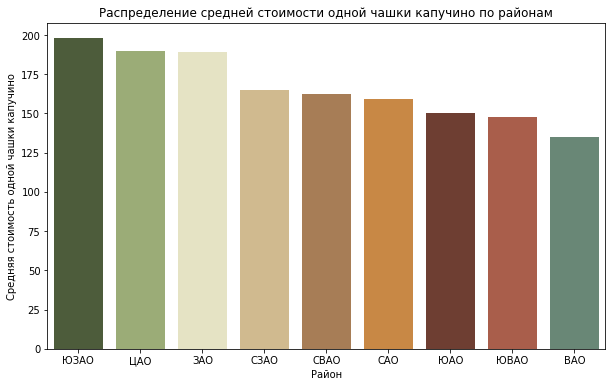

In [90]:
#построим столбчатую диаграмму со медианой стоимости 
cofee_shop_cup = df_cofee_shop.groupby('dist')['middle_coffee_cup'].median().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=cofee_shop_cup.index, y=cofee_shop_cup.values, palette=custom_palette)
plt.title('Распределение средней стоимости одной чашки капучино по районам')
plt.xlabel('Район')
plt.ylabel('Средняя стоимость одной чашки капучино') 
plt.show()

В среднем цена варьируется в районе 150-170 рублей за чашку капучино.
Юго-запад выходит в лидеры по стоимости, выше ЦАО.
В районах СЗАО, СВАО, САО - цена является средней по рынку.
В юго-восточном и восточном округах придется устанавливать стоимость ниже среднего, чтобы оставаться конкурентоспособными. 

### Расмотрим круглосуточные кофейни

In [91]:
#построим круговую диаграмму распределения 
cofee_shop_is_24_7 = df_cofee_shop.groupby('is_24_7')['name'].count()

labels = ['Не круглосуточные' if chain == False else 'Круглосуточные' for chain in count_per_chain.index]
fig = go.Figure(data=[go.Pie(labels=labels, values=cofee_shop_is_24_7.values,
                             marker=dict(colors=['#9EB56E', '#B57D48']))])
fig.update_layout(title_text="Соотношение круглосуточных и не круглосуточных кофеен")
fig.show()

Меньше 5% всех кофеен - круглосуточные.
Расмотрим распредление по районам.

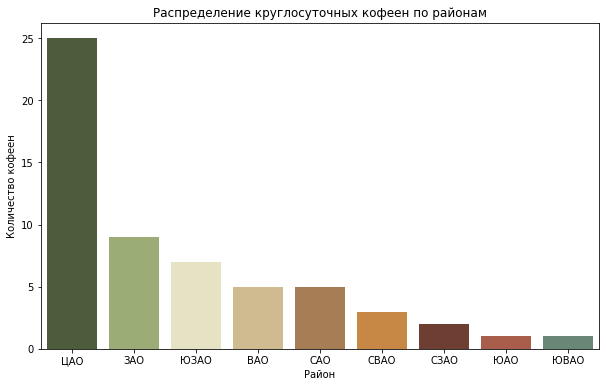

In [92]:
#построим столбчатую диаграмму 
df_cofee_shop_is_24_7 = df_cofee_shop.query('is_24_7 == True')
dist_cofee_shop_is_24_7 = df_cofee_shop_is_24_7.groupby('dist')['name'].count().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=dist_cofee_shop_is_24_7.index, y=dist_cofee_shop_is_24_7.values, palette=custom_palette)
plt.title('Распределение круглосуточных кофеен по районам')
plt.xlabel('Район')
plt.ylabel('Количество кофеен') 
plt.show()

В центральном районе ночная жизнь активнее, поэтому там имеет смысл открывать круглосуточные кофейни.
В остальных районах подобный бизнес может не окупиться.

### Рассмотрим распределение сетевых кофеен по районам

In [93]:
#создаем датафрейм
dist_per_cofee_chain = df_cofee_shop.pivot_table(index='dist', values='name', columns = 'chain', aggfunc='count').reset_index()
dist_per_cofee_chain.columns = ['dist', 'non_chain', 'chain']
dist_per_cofee_chain['non_chain_percent'] = dist_per_cofee_chain['non_chain'] \
                                        / (dist_per_cofee_chain['non_chain'] + dist_per_cofee_chain['chain']) * 100
dist_per_cofee_chain['chain_percent'] = dist_per_cofee_chain['chain'] \
                                    / (dist_per_cofee_chain['non_chain'] + dist_per_cofee_chain['chain']) * 100
sorted_dist_per_cofee_chain = dist_per_cofee_chain.sort_values(by='chain_percent', ascending=False)
sorted_dist_per_cofee_chain = sorted_dist_per_cofee_chain \
                            .rename(columns={'chain_percent': 'Процент сетевых', 'non_chain_percent': 'Процент несетевых'})


In [94]:
#строим столбчатую диаграмму
colors = {'Процент несетевых': '#B57D48', 'Процент сетевых': '#9EB56E'} 
fig = px.bar(sorted_dist_per_cofee_chain, 
             x='dist', 
             y=['Процент несетевых', 'Процент сетевых'],
             title='Процентное распределение сетевых и несетевых заведений по категориям',
             barmode='group',
             color_discrete_map=colors)

fig.update_layout(xaxis_title='Районы', yaxis_title='Процент')
fig.show()

Сетевые кофейни неохотно заходят в малочисленный по данным заведениям юго-восток, возможно поэтому удовлетворенность посетителей, судя по рейтингу, там не такая большая.
Конкурировать с брендом всегда сложно, поэтому ЗАО, СЗАО и ЮЗАО для открытия нового заведения лучше не рассматривать.

### Вывод


Изучив подробнее данные о кофейнях города Москвы мы обнаружили следующее

**Распределение кофеен по районам**

    В датасете представлены 1411 кофеен.
    Больше всего кофеен расположено в центральном округе, плотность их расположения довольно высокая.
    Меньше всего кофеен в северо-западном, юго-восточном и юго-западном округе. 


**Распределение рейтингов по районам**

   Значения по районам не сильно отличаются и варьируются между 4.2 и 4.35. 

    Наивысший показатель у ЦАО, но так же выделяется северо-западный округ.  
    Средний рейтинг этого района лишь немногим отличается от центрального, хотя в нем в 7 раз меньше подобных заведений.
    Наименьший показатель у западного округа.
    Среди районов с наименьшим количеством кофеен (СЗАО, ЮЗАО, ЮВАО) ниже рейтинг у юго-восточного округа.
    
**Стоимость средней чашки капучино**  

    В срднем цена варьируется в районе 150-170 рублей за чашку капучино. 
    Юго-запад выходит в лидеры по стоимости, выше ЦАО. 
    В районах СЗАО, СВАО, САО - цена является средней по рынку. 
    В юго-восточном и восточном округах придется устанавливать стоимость ниже среднего, чтобы оставаться конкурентноспособными.
    
**Круглосуточные кофейни**


    Меньше 5% всех кофеен - круглосутночные.
    В центральном районе ночная жизнь активнее, поэтому там имеет смысл открывать круглосуточные кофейни. 
    В остальных районах подобный бизнес может не окупиться.

**Распределение сетевых кофеен**


    Сетевые кофейни неохотно заходят в малочисленный по данным заведениям юго-восток, 
    возможно поэтому удовлетворенность посетителей, судя по рейтингу, там не такая большая. 
    Конкурировать с брендом всегда сложно, поэтому ЗАО, СЗАО и ЮЗАО для окрытия нового заведения лучше не рассматривать.



### Рекомендации

**Район**  

Среди 9 административных округов мы выбрали три района с наименьшим количеством кофеен,  
это - Юго-Западный административный округ, Юго-Восточный административный округ и Северо-Западный.

*Подробнее о них**

**Северо-Запад:** 
- округ имеет высокие оценки рейтинга у имеющихся коффен, 
- цена одной чашки выше средней по рынку и составляет 165 рублей,
- большая часть заведений - сетевые кофейни

В данном округе будет сложнее конкурировать со знакомыми покупателям брендами, имеющими высокие рейтинги.
Новая кофейня будет иметь успех, если привлечет покупателей новым продуктом-фишкой, например необычным кофейным коктейлем или кофе уникальной прожарки и сорта, при этом будет обладать высоким уровнем обслуживания и сумеет при этом остаться в рамках рыночной цены. 

**Юго-Запад:**
- рейтинг кофеен соответсвует среднему по всем округам
- цена одной чашки капучино наивысшая и составляет 198 рублей
- большая часть заведений - сетевые кофейни

В данном округе можно открыть кофейню с более доступными ценами, при этом сделать упор на более кастомном обслуживании (например персональные пожелания на стаканчиках с кофе), что позволит увеличить лояльность покупателей и выделиться среди других брендов. 

**Юго-Восток:**
- у кофейн рейтинги ниже средних по остальным округам
- цена одной чашки капучино ниже средней и составляет 147,5 рублей
- большая часть заведений - несетевые

В данном округе можно создать бренд кофеен с высоким уровнем обслуживания и качества продукции. Чтобы остаться конкуреноспособными по стоимости, в начале оперирования можно прибегнуть к скидкам и акциям, для охвата большей аудитории.
Впоследствии часть покупатели, полюбивших бренд, останутся лояльными и будут отдавать предпочтение качеству, а не цене.

Так же при планировании открытия новой кофейни стоит ориентироваться на:
- количество посадочных мест 70-80 
- часы работы некруглосуточные


## Презентация

Презентацию с общими выводами по иследованию вы найдете по этой ссылке:

https://disk.yandex.ru/i/o9kGN94Ajf4hkg 